<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:180%;
             text-align:center;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:Vardana;
             border:2px solid blue;
             font-family:Century;
             padding:10px 20px;">💉🦠😷 Covid 19 - EDA 😷🦠💉
</div>

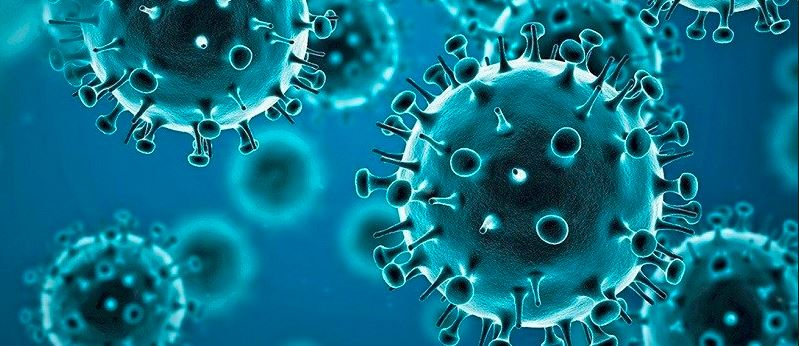

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Importing Libraries
</div>

In [194]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go

In [195]:
# Ignore warnings

import warnings
warnings.filterwarnings("ignore")

In [196]:
# Set max rows and columns

pd.set_option("max_columns", None)
pd.set_option("max_rows", None)

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Importing DataSets
</div>

In [197]:
covid_data = pd.read_csv("covid_19_clean_complete.csv")
day_wise_data = pd.read_csv("day_wise.csv")
full_grouped_data = pd.read_csv("full_grouped.csv")
usa_data = pd.read_csv("usa_county_wise.csv")
country_data = pd.read_csv("country_wise_latest.csv")
world_data = pd.read_csv("worldometer_data.csv")

In [198]:
# Top 5 columns of covid_data

covid_data.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.0000,65.0000,22/01/2020,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.1533,20.1683,22/01/2020,0,0,0,0,Europe
2,NaN,Algeria,28.0339,1.6596,22/01/2020,0,0,0,0,Africa
3,NaN,Andorra,42.5063,1.5218,22/01/2020,0,0,0,0,Europe
4,NaN,Angola,-11.2027,17.8739,22/01/2020,0,0,0,0,Africa


In [199]:
fig = go.Figure(data=[go.Table(
                                
                                header=dict(values=['Total Cases', 'Total Deaths',"Total Recovered","Active Cases","Total Tests"],
                                line_color='darkslategray',
                                fill_color='DarkRed',
                                align='center',
                                font=dict(color="white", size=12)),
    
                                cells=dict(values=[sum(world_data["TotalCases"]),
                                                  sum(world_data["TotalDeaths"][world_data.TotalDeaths>0]),
                                                  sum(world_data["TotalRecovered"][world_data.TotalRecovered>0]),
                                                  sum(world_data["ActiveCases"][world_data.ActiveCases>0]),
                                                  sum(world_data["TotalTests"][world_data.TotalTests>0])], 
                                line_color='darkslategray',
                                fill_color='white',
                                           align='center',
                                font=dict(color="darkslategray", size=12))
)])

fig.update_layout(width=800, height=300)
fig.show()

In [200]:
df = covid_data.groupby("Country/Region")["Confirmed","Deaths","Recovered","Active"].sum()
df.head()

,Confirmed,Deaths,Recovered,Active
Country/Region,,,,
Afghanistan,646624,12976,87039,546609
Albania,71576,2422,47525,21629
Algeria,473539,39564,260772,173203
Andorra,60642,3395,37859,19388
Angola,4335,240,1314,2781


<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Country Wise Total Confirmed Cases
</div>

In [201]:
fig = px.choropleth(locations=df.index, locationmode='country names', 
                  color=df.values[:,0], hover_name=df.index, title="Total Confirmed Cases", color_continuous_scale="Reds")
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Country Wise Total Deaths
</div>

In [202]:
fig = px.choropleth(locations=df.index, locationmode='country names', 
                  color=df.values[:,1], hover_name=df.index, title="Total Death Cases", color_continuous_scale="Reds")
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Country Wise Total Recovered
</div>

In [203]:
fig = px.choropleth(locations=df.index, locationmode='country names', 
                  color=df.values[:,2], hover_name=df.index, title="Total Recovered Cases", color_continuous_scale="blues")
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Country Wise Total Active Cases
</div>

In [204]:
fig = px.choropleth(locations=df.index, locationmode='country names', 
                  color=df.values[:,3], hover_name=df.index, title="Total Active Cases", color_continuous_scale="Reds")
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Total Confirmed Cases Based On Country and Region
</div>

In [205]:
fig = px.treemap(country_data, path=["WHO Region","Country/Region"], values="Confirmed", color="Country/Region")
fig.update_traces(marker=dict(line=dict(color='black', width=1)))
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Count Based On Region
</div>

In [206]:
df = covid_data.groupby("WHO Region")[["Confirmed","Deaths","Recovered","Active"]].sum()
fig = px.bar(df, barmode="group", labels={"value":"Cases Count"})
fig.update_traces(marker=dict(line=dict(color='black', width=2)))
fig.show()

In [207]:
day_wise_data.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
1,2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2,2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13


<div style="
            display:fill;
            background-color:#FA8072;
            color:black;
            font-size:120%;
            text-align:left;
            border-radius:80px 30px;
            font-weight:bold;
            font-family:Comic Sans MS;
            border:2px solid crimson;
            padding:5px 20px;">🔷🔷 Count of cases Date Wise
</div>

In [208]:
fig = px.bar(day_wise_data, x='Date', y=["Confirmed","Deaths",'Recovered',"Active"])
fig.update_traces(marker=dict(line=dict(color='black', width=0.5)))

fig.show()

In [209]:
fig = px.bar(day_wise_data, x='Date', y=["Deaths / 100 Cases","Recovered / 100 Cases","Deaths / 100 Recovered"])
fig.update_traces(marker=dict(line=dict(color='black', width=0.5)))

fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Count Based On Months
</div>

In [210]:
day_wise_data.Date = pd.to_datetime(day_wise_data.Date)
day_wise_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149 entries, 0 to 148
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    149 non-null    datetime64[ns]
 1   Confirmed               149 non-null    int64         
 2   Deaths                  149 non-null    int64         
 3   Recovered               149 non-null    int64         
 4   Active                  149 non-null    int64         
 5   New cases               149 non-null    int64         
 6   New deaths              149 non-null    int64         
 7   New recovered           149 non-null    int64         
 8   Deaths / 100 Cases      149 non-null    float64       
 9   Recovered / 100 Cases   149 non-null    float64       
 10  Deaths / 100 Recovered  149 non-null    float64       
 11  No. of countries        149 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory 

In [211]:
# Inserting column name "Month"

day_wise_data['Month'] = day_wise_data["Date"].dt.month
day_wise_data.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries,Month
0,2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6,1
1,2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8,1
2,2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9,1
3,2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11,1
4,2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13,1


In [212]:
# Mapping month with Month Name

day_wise_data["Month"] = day_wise_data.Month.replace({1:"Jan", 2:"Feb",3:"Mar",4:"Apr",5:"May",6:"Jun"})

In [213]:
def month_plot(y_value, color):
    fig = px.histogram(x=day_wise_data.Month, y=day_wise_data[y_value],
                title="Month Wise "+y_value+ " Cases",
                marginal='violin',
                color_discrete_sequence=[color]
                      )
    fig.update_layout(
        xaxis_title_text="Month",
        yaxis_title_text='Sum of Confirmed Cases'
    )
    fig.update_traces(marker=dict(line=dict(color='black', width=2)))

    fig.show()

In [214]:
month_plot("Confirmed","darkorange")

In [215]:
month_plot("Deaths","red")

In [216]:
month_plot("Recovered", "mediumturquoise")

In [217]:
month_plot("Deaths / 100 Cases","blue")

In [218]:
month_plot("Recovered / 100 Cases","purple")

In [219]:
month_plot("Deaths / 100 Recovered","gold")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Count Based On Country
</div>

In [220]:
country_data.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [221]:
def plot_country(y_value):
    df = country_data.sort_values(by=y_value, ascending=False).head(20)
    fig = px.bar(df, x="Country/Region", y=y_value,color="WHO Region", text=y_value, 
                 title=("Top 20 Countries with highest "+y_value+" Cases"))

    # Put bar total value above bars with 2 values of precision
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside',
                     marker=dict(line=dict(color='black', width=2)))
    
    fig.update_layout(xaxis_tickangle=-45)


    fig.show()

In [222]:
plot_country("Confirmed")

In [223]:
plot_country("Deaths")

In [224]:
plot_country("Recovered")

In [225]:
plot_country("Active")

In [226]:
plot_country("Deaths / 100 Cases")

In [227]:
plot_country("Recovered / 100 Cases")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Percentage of Total Covid Cases Based on Continents
</div>

In [228]:
world_data.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region
0,USA,North America,3.309388e+08,2263749,98.0,120688.0,NaN,931076.0,82.0,1211985.0,16503.0,6840.0,365.0,26724848.0,80755.0,Americas
1,Brazil,South America,2.125087e+08,983359,NaN,47869.0,NaN,520360.0,16853.0,415130.0,8318.0,4627.0,225.0,2344437.0,11032.0,Americas
2,Russia,Europe,1.459326e+08,569063,7972.0,7841.0,181.0,324406.0,10443.0,236816.0,2300.0,3899.0,54.0,16321964.0,111846.0,Europe
3,India,Asia,1.379530e+09,381485,394.0,12605.0,1.0,205183.0,1.0,163697.0,8944.0,277.0,9.0,6426627.0,4659.0,South-EastAsia
4,UK,Europe,6.787438e+07,300469,NaN,42288.0,NaN,NaN,NaN,NaN,379.0,4427.0,623.0,7259555.0,106956.0,Europe


In [229]:
df = world_data.groupby("Continent")["TotalCases"].sum()
label_values = df.index
y_values = df.values
colors = ['blue', 'green', 'black', 'purple', 'red', 'gold']

fig = go.Figure()
fig.add_traces(go.Pie(labels=label_values, 
                       values=y_values))

# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent', pull=[0.2, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='black', width=2)))
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Population VS Covid Cases
</div>

In [230]:
def plot_population(y_value):
    df = world_data.sort_values(by="Population", ascending=False).head(20)
    fig = px.bar(df, x="Country/Region", y="Population", color=y_value, text=y_value, 
                 title=("Population VS "+y_value))

    # Put bar total value above bars with 2 values of precision
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.update_traces(marker=dict(line=dict(color='black', width=2)))

    fig.update_layout(xaxis_tickangle=-45)


    fig.show()

In [231]:
plot_population("TotalCases")

In [232]:
plot_population("TotalDeaths")

In [233]:
plot_population("TotalRecovered")

In [234]:
plot_population("ActiveCases")

In [235]:
plot_population("Serious,Critical")

In [236]:
plot_population("Tot Cases/1M pop")

In [237]:
plot_population("Deaths/1M pop")

In [238]:
plot_population("TotalTests")

In [239]:
plot_population("Tests/1M pop")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Country Wise/Date Wise Covid Cases
</div>

In [240]:
full_grouped_data.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa


In [241]:
def day_city_count(y_value):
    fig = go.Figure()

    country_list = list(full_grouped_data['Country/Region'].unique())

    for country in country_list:
        fig.add_trace(
            go.Scatter(
                x = full_grouped_data['Date'][full_grouped_data['Country/Region']==country],
                y = full_grouped_data[y_value][full_grouped_data['Country/Region']==country],
                name = country, visible = True
            )
        )

    buttons = []

    for i, country in enumerate(country_list):
        args = [False] * len(country_list)
        args[i] = True

        button = dict(label = country,
                      method = "update",
                      args=[{"visible": args}])

        buttons.append(button)

    fig.update_layout(
        updatemenus=[dict(
                        active=0,
                        type="dropdown",
                        buttons=buttons,
                        x = 0,
                        y = 1.1,
                        xanchor = 'left',
                        yanchor = 'bottom'
                    )], 
        autosize=False,
        width=1000,
        height=600
    )
    fig.show()

In [242]:
day_city_count("Confirmed")

In [243]:
day_city_count("Deaths")

In [244]:
day_city_count("Recovered")

In [245]:
day_city_count("Active")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 USA Covid Analysis
</div>

In [246]:
df = usa_data.groupby("Province_State")["Confirmed","Deaths"].sum()
df = df.reset_index()

In [247]:
def us_plot(y_value):
    df_Raw = df.sort_values(by=y_value, ascending=False).head(20)
    fig = px.bar(df_Raw, x="Province_State", y=y_value, color=y_value, text=y_value, 
                 title=("Top 20 Countries with highest "+y_value+" Cases"))

    # Put bar total value above bars with 2 values of precision
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')

    fig.update_layout(xaxis_tickangle=-45)
    fig.update_traces(marker=dict(line=dict(color='black', width=2)))


    fig.show()

In [248]:
us_plot("Confirmed")

In [249]:
us_plot("Deaths")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 USA - From The Total Confirmed Cases How Many Are Recovered/Dead - World Wide
</div>

In [250]:
world_temp = world_data[~world_data["WHO Region"].isnull()]
world_temp = world_temp.sort_values(by="TotalCases", ascending=False).head(20)

In [251]:
fig = px.bar(world_temp, x="Country/Region", y=["TotalCases","TotalDeaths","TotalRecovered"], barmode="group")
fig.update_traces(marker=dict(line=dict(color='black', width=2)))
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 INDIA Covid Analysis
</div>

In [252]:
# Import Data

india_data = pd.read_csv("covid_19_india.csv")
state_data_india = pd.read_csv("covid_vaccine_statewise.csv")

In [253]:
india_data.head(2)

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,30/01/2020,6:00 PM,Kerala,1,0,0,0,1
1,2,31/01/2020,6:00 PM,Kerala,1,0,0,0,1


In [254]:
state_data_india.head(2)

,Updated On,State,Total Doses Administered,Sessions,Sites,First Dose Administered,Second Dose Administered,Male (Doses Administered),Female (Doses Administered),Transgender (Doses Administered),Covaxin (Doses Administered),CoviShield (Doses Administered),Sputnik V (Doses Administered),AEFI,18-44 Years (Doses Administered),45-60 Years (Doses Administered),60+ Years (Doses Administered),18-44 Years(Individuals Vaccinated),45-60 Years(Individuals Vaccinated),60+ Years(Individuals Vaccinated),Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Individuals Vaccinated
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,NaN,NaN,NaN,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23757.0,24517.0,2.0,48276.0
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,NaN,NaN,NaN,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27348.0,31252.0,4.0,58604.0


In [255]:
india_data.drop("Sno", axis=1, inplace=True)

In [256]:
india_data.head(2)

,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,30/01/2020,6:00 PM,Kerala,1,0,0,0,1
1,31/01/2020,6:00 PM,Kerala,1,0,0,0,1


In [257]:
india_data["State/UnionTerritory"].unique()

array(['Kerala', 'Telengana', 'Delhi', 'Rajasthan', 'Uttar Pradesh',
       'Haryana', 'Ladakh', 'Tamil Nadu', 'Karnataka', 'Maharashtra',
       'Punjab', 'Jammu and Kashmir', 'Andhra Pradesh', 'Uttarakhand',
       'Odisha', 'Puducherry', 'West Bengal', 'Chhattisgarh',
       'Chandigarh', 'Gujarat', 'Himachal Pradesh', 'Madhya Pradesh',
       'Bihar', 'Manipur', 'Mizoram', 'Andaman and Nicobar Islands',
       'Goa', 'Assam', 'Jharkhand', 'Arunachal Pradesh', 'Tripura',
       'Nagaland', 'Meghalaya',
       'Dadra and Nagar Haveli and Daman and Diu', 'Sikkim',
       'Lakshadweep', 'Telangana', 'Himanchal Pradesh', 'Karanataka'],
      dtype=object)

In [258]:
# Replace State Names

india_data["State/UnionTerritory"].replace({"Maharashtra***":"Maharashtra", "Bihar****":"Bihar", 
                        "Madhya Pradesh***":"Madhya Pradesh", "Daman & Diu":"Dadra and Nagar Haveli and Daman and Diu",
                                     "Dadra and Nagar Haveli":"Dadra and Nagar Haveli and Daman and Diu",
                                            "Telengana":"Telangana"
                                           }, inplace=True)

In [259]:
india_data["State/UnionTerritory"].unique()

array(['Kerala', 'Telangana', 'Delhi', 'Rajasthan', 'Uttar Pradesh',
       'Haryana', 'Ladakh', 'Tamil Nadu', 'Karnataka', 'Maharashtra',
       'Punjab', 'Jammu and Kashmir', 'Andhra Pradesh', 'Uttarakhand',
       'Odisha', 'Puducherry', 'West Bengal', 'Chhattisgarh',
       'Chandigarh', 'Gujarat', 'Himachal Pradesh', 'Madhya Pradesh',
       'Bihar', 'Manipur', 'Mizoram', 'Andaman and Nicobar Islands',
       'Goa', 'Assam', 'Jharkhand', 'Arunachal Pradesh', 'Tripura',
       'Nagaland', 'Meghalaya',
       'Dadra and Nagar Haveli and Daman and Diu', 'Sikkim',
       'Lakshadweep', 'Himanchal Pradesh', 'Karanataka'], dtype=object)

In [260]:
# drop "unassigned" rows from the data

india_data = india_data[india_data["State/UnionTerritory"]!="Unassigned"]

In [261]:
# Droping rows with "Cases being reassigned to states"

india_data = india_data[india_data["State/UnionTerritory"]!="Cases being reassigned to states"]

In [262]:
# State wise Confirmed, Cured and Death total

groupby_india = india_data.groupby(by=["State/UnionTerritory"])["Confirmed","Cured","Deaths"].sum().reset_index()
groupby_india

,State/UnionTerritory,Confirmed,Cured,Deaths
0,Andaman and Nicobar Islands,1938498,1848286,27136
1,Andhra Pradesh,392432753,370426530,2939367
2,Arunachal Pradesh,7176907,6588149,26799
3,Assam,99837011,92678680,638323
4,Bihar,133662075,126525370,1112347
5,Chandigarh,10858627,10117035,147694
6,Chhattisgarh,163776262,151609364,2063920
7,Dadra and Nagar Haveli and Daman and Diu,1959356,1862102,1022
8,Delhi,287227765,273419887,4943294
9,Goa,28240159,26027201,447801


<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 India - Top 20 States with highest Confirmed | Cured | Deaths Cases.
</div>

In [263]:
def plot_india(y_value):
    df = groupby_india.sort_values(by=y_value, ascending=False).head(20)
    fig = px.bar(df, x="State/UnionTerritory", y=y_value, color=y_value, text=y_value, 
                 title=("State/UnionTerritory - "+y_value))

    # Put bar total value above bars with 2 values of precision
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.update_traces(marker=dict(line=dict(color='black', width=2)))

    fig.update_layout(xaxis_tickangle=-45)


    fig.show()

In [264]:
plot_india("Confirmed")

In [265]:
plot_india("Deaths")

In [266]:
plot_india("Cured")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 India - State Wise/Date Wise Covid Cases.
</div>

In [267]:
def plot_Date_India(y_value):
    fig = go.Figure()

    state_list = list(india_data['State/UnionTerritory'].unique())

    for country in state_list:
        fig.add_trace(
            go.Scatter(
                x = india_data['Date'][india_data['State/UnionTerritory']==country],
                y = india_data[y_value][india_data['State/UnionTerritory']==country],
                name = country, visible = True
            )
        )

    buttons = []

    for i, country in enumerate(state_list):
        args = [False] * len(state_list)
        args[i] = True

        button = dict(label = country,
                      method = "update",
                      args=[{"visible": args}])

        buttons.append(button)

    fig.update_layout(
        updatemenus=[dict(
                        active=0,
                        type="dropdown",
                        buttons=buttons,
                        x = 0,
                        y = 1.1,
                        xanchor = 'left',
                        yanchor = 'bottom'
                    )], 
        autosize=False,
        width=1000,
        height=600
    )
    fig.show()

In [268]:
plot_Date_India("Confirmed")

In [269]:
plot_Date_India("Cured")

In [270]:
plot_Date_India("Deaths")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 India - Out of Total Confirmed Cases, Count of Cured and Deaths.
</div>

In [271]:
groupby_india = groupby_india.sort_values(by="Confirmed", ascending=False).head(20)

fig = px.bar(groupby_india, x="State/UnionTerritory", y=["Confirmed","Cured","Deaths"], barmode="group")
fig.show()

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 India - State With Lowest Confirmed and Death Cases.
</div>

In [272]:
All_State_group = india_data.groupby(by="State/UnionTerritory")["Cured", "Deaths", "Confirmed"].sum().reset_index()

In [273]:
def plot_india_lowest(y_value):
    df = All_State_group.sort_values(by=y_value).head(10)
    fig = px.bar(df, y="State/UnionTerritory", x=y_value, color=y_value, text=y_value, 
                 title=("State/UnionTerritory - "+y_value))

    # Put bar total value above bars with 2 values of precision
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.update_traces(marker=dict(line=dict(color='black', width=2)))

    fig.update_layout(xaxis_tickangle=-45)


    fig.show()

In [274]:
plot_india_lowest("Deaths")

In [275]:
plot_india_lowest("Confirmed")

<div style="
             display:fill;
             background-color:lightblue;
             color:black;
             font-size:120%;
             text-align:left;
             border-radius:80px 30px;
             font-weight:bold;
             font-family:century;
             border:2px solid blue;
             padding:5px 20px;">🔴🔴 Top 10 Vaccinated State In India.
</div>

In [276]:
state_data_india = state_data_india[state_data_india["State"]!="India"]

In [277]:
state_group = state_data_india.groupby(by="State")["Total Doses Administered","First Dose Administered","Second Dose Administered"
                                                  ,"Male(Individuals Vaccinated)",
                                                  "Female(Individuals Vaccinated)",
                                                  "Transgender(Individuals Vaccinated)",
                                                   "Total Individuals Vaccinated",
                                                  " Covaxin (Doses Administered)",
                                                  "CoviShield (Doses Administered)",
                                                  "Sputnik V (Doses Administered)"].sum().reset_index()
state_group.head(2)

,State,Total Doses Administered,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Individuals Vaccinated,Covaxin (Doses Administered),CoviShield (Doses Administered),Sputnik V (Doses Administered)
0,Andaman and Nicobar Islands,2.054441e+07,1.642585e+07,4118554.0,0.0,0.0,0.0,8102125.0,0.0,2.051143e+07,0.0
1,Andhra Pradesh,1.591678e+09,1.232861e+09,358817595.0,0.0,0.0,0.0,564591113.0,263695249.0,1.323987e+09,1412491.0


In [278]:
state_group = state_group.sort_values(by="Total Doses Administered", ascending=False).head(10)

In [279]:
y_value = ["Total Doses Administered","First Dose Administered","Second Dose Administered","Total Individuals Vaccinated"]
fig = px.bar(state_group, x="State", y=y_value, barmode="group")
fig.update_traces(marker=dict(line=dict(color='black', width=2)))
fig.show()